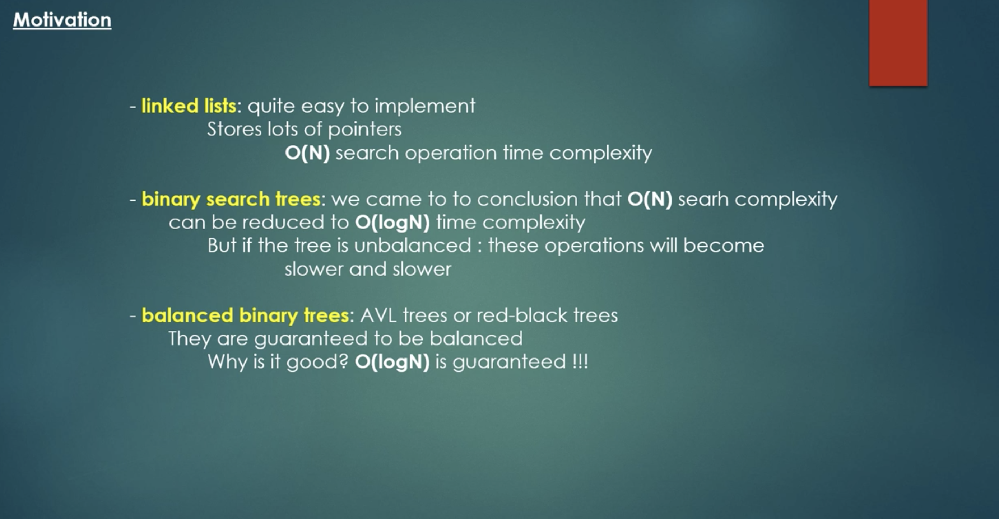

In [1]:
from IPython.display import Image
Image("avl_tree_1.png",width=700,height=500)

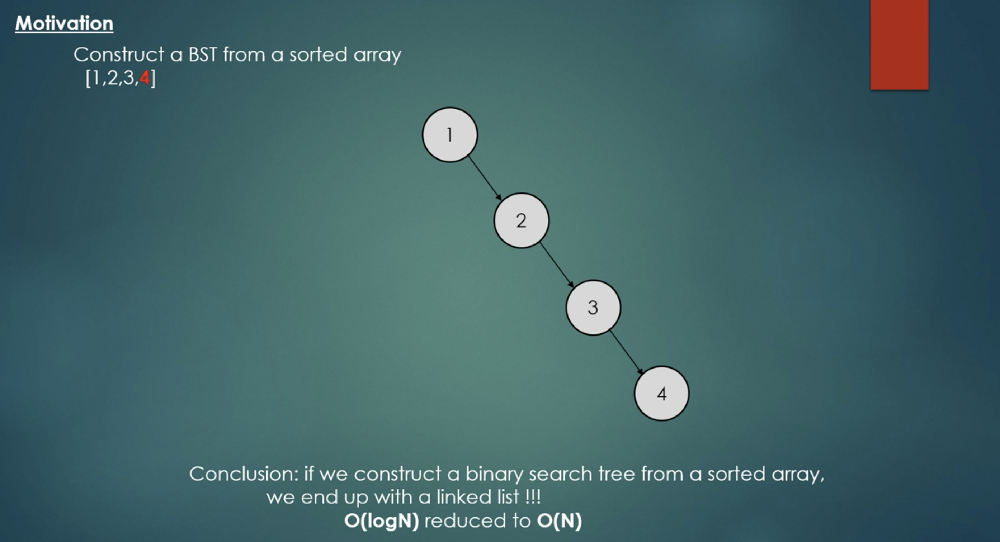

In [2]:
Image("avl_tree_2.png",width=700,height=500)

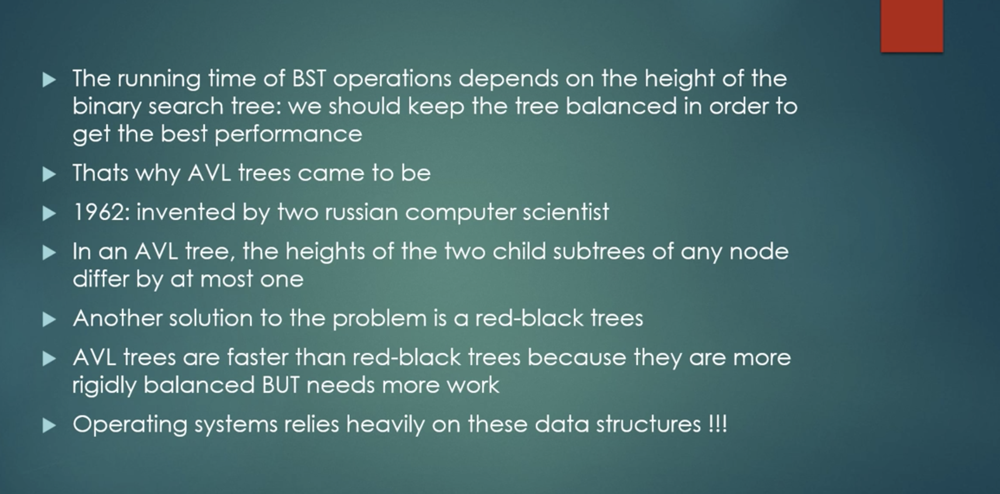

In [3]:
Image("avl_tree_3.png",width=700,height=500)

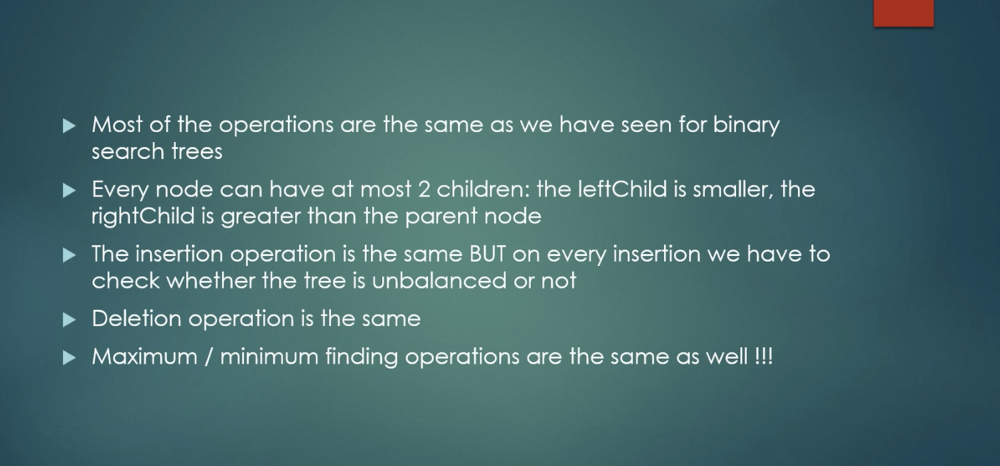

In [4]:
Image("avl_tree_4.png",width=700,height=500)

In [ ]:
class Node(object):
    
    def __init__(self, data):
        self.data = data
        self.height = 0
        self.left = None
        self.right = None
        
class AVL(object):
    
    def __init__(self):
        self.root = None
        
    def remove(self, data):
        if self.root:
            self.root = self.removeNode(data, self.root)
            
    def insert(self,data):
        self.root = self.insertNode(data, self.root)
        
    def insertNode(self, data, node):
        
        if not node:
            return Node(data)
        
        if node.data > data:
            node.left  = self.insertNode(data, node.leftChild)
        else:
            node.right = self.insertNode(data, node.rightChild)
            
        node.height = max(self.calcHeight(node.left), self.calcHeight(node.right)) + 1
        
        return self.settleViolation(data, node)
    
    def settleViolation(self, data, node):
        
        balance = self.calcBalance(node)
        
        
        
        
        return node
    
    # if it returns > 1 left heavy tree -> right rotation
    # else ... < -1 right heavy tree -> left rotation
    def calcBalance(self, node):
        
        if not node:
            return -1
        
        return self.calcHeight(node.left) - self.calcHeight(node.right)
    
    def getPredecessor(self,node):
        
        if node.right:
            return self.getPredecessor(node.right)
            
        return node
            
    def calcHeight(self,node):
        
        if not node:
            return -1
        
        return node.height
    
    def traverse(self):
        if self.root:
            return traverseInOrder(self.root)
        
    def traverseInOrder(self,node):
        
        if node.left:
            self.traverseInOrder(node.left)
            
        print(node.data)
        
        if node.right:
            self.traverseInOrder(node.right)
        
        

In [6]:
class Node(object):

    def __init__(self, data):
        self.data = data;
        self.height = 0;
        self.leftChild = None;
        self.rightChild = None;

class AVL(object):

    def __init__(self):
        self.root = None;

    def remove(self, data):
        if self.root:
            self.root = self.removeNode(data, self.root);

    def insert(self, data):
        self.root = self.insertNode(data, self.root);

    def insertNode(self, data, node):

        if not node:
            return Node(data);

        if data < node.data:
            node.leftChild = self.insertNode(data, node.leftChild);
        else:
            node.rightChild = self.insertNode(data, node.rightChild);

        node.height = max( self.calcHeight(node.leftChild) , self.calcHeight(node.rightChild) ) + 1;

        return self.settleViolation(data, node);

    def removeNode(self,data, node):

        if not node:
            return node;

        if data < node.data:
            node.leftChild = self.removeNode(data, node.leftChild);
        elif data > node.data:
            node.rightChild = self.removeNode(data, node.rightChild);
        else:

            if not node.leftChild and not node.rightChild:
                print("Removing a leaf node...");
                del node;
                return None;

            if not node.leftChild:
                print("Removing a node with a right child...");
                tempNode = node.rightChild;
                del node;
                return tempNode;
            elif not node.rightChild:
                print("Removing a node with a left child...");
                tempNode = node.leftChild;
                del node;
                return tempNode;

            print("Removing node with two children...");
            tempNode = self.getPredecessor(node.leftChild);
            node.data = tempNode.data;
            node.leftChild = self.removeNode(tempNode.data, node.leftChild);

        if not node:
            return node; # if the tree had just a single node

        node.height = max( self.calcHeight(node.leftChild) , self.calcHeight(node.rightChild) ) + 1;

        balance = self.calcBalance(node);

        # doubly left heavy situation
        if balance > 1 and self.calcBalance(node.leftChild) >= 0:
            return self.rotateRight(node);

        # left right case
        if balance > 1 and self.calcBalance(node.leftChild) < 0:
            node.leftChild = self.rotateLeft(node.leftChild);
            return self.rotateRight(node);

        # right right case
        if balance < -1 and self.calcBalance(node.rightChild) <= 0:
            return self.rotateLeft(node);

        # right left case
        if balance < -1 and self.calcBalance(node.rightChild) > 0:
            node.rightChild = self.rotateRight(node.rightChild);
            return self.rotateLeft(node);

        return node;

    def getPredecessor(self, node):

        if node.rightChild:
            return self.getPredecessor(node.rightChild);

        return node;

    def settleViolation(self, data, node):

        balance = self.calcBalance(node);

        # case 1  -> left left heavy situation
        if balance > 1 and data < node.leftChild.data:
            print("Left left heavy situation...");
            return self.rotateRight(node);

        # case 2 --> right right heavy situation --> single left rotation
        if balance < - 1 and data > node.rightChild.data:
            print("Right right heavy situation...");
            return self.rotateLeft(node);

        if balance > 1 and data > node.leftChild.data:
            print("Left right heavy situation...");
            node.leftChild = self.rotateLeft(node.leftChild);
            return self.rotateRight(node);

        if balance < - 1 and data < node.rightChild.data:
            print("Right left heavy situation...");
            node.rightChild = self.rotateRight(node.rightChild);
            return self.rotateLeft(node);

        return node;

    def calcHeight(self, node):

        if not node:
            return -1;

        return node.height;

    # if it returns value > 1  it means it is a left heavy tree --> right rotation
    #  ......             < -1   right heavy tree -> left rotation
    def calcBalance(self, node):

        if not node:
            return 0;

        return self.calcHeight(node.leftChild) - self.calcHeight(node.rightChild);

    def traverse(self):
        if self.root:
            self.traverseInorder(self.root);

    def traverseInorder(self, node):

        if node.leftChild:
            self.traverseInorder(node.leftChild);

        print("%s " % node.data);

        if node.rightChild:
            self.traverseInorder(node.rightChild);

    def rotateRight(self, node):

        print("Rotating to the right on node " , node.data);

        tempLeftChild = node.leftChild;
        t = tempLeftChild.rightChild;

        tempLeftChild.rightChild = node;
        node.leftChild = t;

        node.height = max( self.calcHeight(node.leftChild) , self.calcHeight(node.rightChild) ) + 1;
        tempLeftChild.height = max( self.calcHeight(tempLeftChild.leftChild) , self.calcHeight(tempLeftChild.rightChild) ) + 1;

        return tempLeftChild;

    def rotateLeft(self, node):

        print("Rotating to the left on node " , node.data);

        tempRightChild = node.rightChild;
        t = tempRightChild.leftChild;

        tempRightChild.leftChild = node;
        node.rightChild = t;

        node.height = max( self.calcHeight(node.leftChild) , self.calcHeight(node.rightChild) ) + 1;
        tempRightChild.height = max( self.calcHeight(tempRightChild.leftChild) , self.calcHeight(tempRightChild.rightChild) ) + 1;

        return tempRightChild;


avl = AVL();
avl.insert(10);
avl.insert(20);
avl.insert(5);
avl.insert(6);
avl.insert(15);

avl.remove(15);
avl.remove(20);

avl.traverse();

Removing a leaf node...
Removing a leaf node...
Rotating to the left on node  5
Rotating to the right on node  10
5 
6 
10 


In [18]:
class Node(object):

    def __init__(self, data):
        self.data = data;
        self.height = 0;
        self.leftChild = None;
        self.rightChild = None;

class AVL(object):

    def __init__(self):
        self.root = None;

    def remove(self, data):
        if self.root:
            self.root = self.removeNode(data, self.root);

    def insert(self, data):
        self.root = self.insertNode(data, self.root);

    def insertNode(self, data, node):

        if not node:
            return Node(data);

        if data < node.data:
            node.leftChild = self.insertNode(data, node.leftChild);
        else:
            node.rightChild = self.insertNode(data, node.rightChild);

        node.height = max( self.calcHeight(node.leftChild) , self.calcHeight(node.rightChild) ) + 1;

        return self.settleViolation(data, node);

    def removeNode(self,data, node):

        if not node:
            return node;

        if data < node.data:
            node.leftChild = self.removeNode(data, node.leftChild);
        elif data > node.data:
            node.rightChild = self.removeNode(data, node.rightChild);
        else:

            if not node.leftChild and not node.rightChild:
                print("Removing a leaf node...");
                del node;
                return None;

            if not node.leftChild:
                print("Removing a node with a right child...");
                tempNode = node.rightChild;
                del node;
                return tempNode;
            elif not node.rightChild:
                print("Removing a node with a left child...");
                tempNode = node.leftChild;
                del node;
                return tempNode;

            print("Removing node with two children...");
            tempNode = self.getPredecessor(node.leftChild);
            node.data = tempNode.data;
            node.leftChild = self.removeNode(tempNode.data, node.leftChild);

        if not node:
            return node; # if the tree had just a single node

        node.height = max( self.calcHeight(node.leftChild) , self.calcHeight(node.rightChild) ) + 1;

        balance = self.calcBalance(node);

        # doubly left heavy situation
        if balance > 1 and self.calcBalance(node.leftChild) >= 0:
            return self.rotateRight(node);

        # left right case
        if balance > 1 and self.calcBalance(node.leftChild) < 0:
            node.leftChild = self.rotateLeft(node.leftChild);
            return self.rotateRight(node);

        # right right case
        if balance < -1 and self.calcBalance(node.rightChild) <= 0:
            return self.rotateLeft(node);

        # right left case
        if balance < -1 and self.calcBalance(node.rightChild) > 0:
            node.rightChild = self.rotateRight(node.rightChild);
            return self.rotateLeft(node);

        return node;

    def getPredecessor(self, node):

        if node.rightChild:
            return self.getPredecessor(node.rightChild);

        return node;

    def settleViolation(self, data, node):

        balance = self.calcBalance(node);

        # case 1  -> left left heavy situation
        if balance > 1 and data < node.leftChild.data:
            print("Left left heavy situation...");
            print('node.leftChild.data = {}'.format(node.leftChild.data))
            print('data = {}'.format(data))
            return self.rotateRight(node);

        # case 2 --> right right heavy situation --> single left rotation
        if balance < - 1 and data > node.rightChild.data:
            print("Right right heavy situation...");
            return self.rotateLeft(node);

        if balance > 1 and data > node.leftChild.data:
            print("Left right heavy situation...");
            node.leftChild = self.rotateLeft(node.leftChild);
            return self.rotateRight(node);

        if balance < - 1 and data < node.rightChild.data:
            print("Right left heavy situation...");
            node.rightChild = self.rotateRight(node.rightChild);
            return self.rotateLeft(node);

        return node;

    def calcHeight(self, node):

        if not node:
            return -1;

        return node.height;

    # if it returns value > 1  it means it is a left heavy tree --> right rotation
    #  ......             < -1   right heavy tree -> left rotation
    def calcBalance(self, node):

        if not node:
            return 0;

        return self.calcHeight(node.leftChild) - self.calcHeight(node.rightChild);

    def traverse(self):
        if self.root:
            self.traverseInorder(self.root);

    def traverseInorder(self, node):

        if node.leftChild:
            self.traverseInorder(node.leftChild);

        print("%s " % node.data);

        if node.rightChild:
            self.traverseInorder(node.rightChild);

    def rotateRight(self, node):

        print("Rotating to the right on node " , node.data);

        tempLeftChild = node.leftChild;
        t = tempLeftChild.rightChild;

        tempLeftChild.rightChild = node;
        node.leftChild = t;

        node.height = max( self.calcHeight(node.leftChild) , self.calcHeight(node.rightChild) ) + 1;
        tempLeftChild.height = max( self.calcHeight(tempLeftChild.leftChild) , self.calcHeight(tempLeftChild.rightChild) ) + 1;

        return tempLeftChild;

    def rotateLeft(self, node):

        print("Rotating to the left on node " , node.data);

        tempRightChild = node.rightChild;
        t = tempRightChild.leftChild;

        tempRightChild.leftChild = node;
        node.rightChild = t;

        node.height = max( self.calcHeight(node.leftChild) , self.calcHeight(node.rightChild) ) + 1;
        tempRightChild.height = max( self.calcHeight(tempRightChild.leftChild) , self.calcHeight(tempRightChild.rightChild) ) + 1;

        return tempRightChild;


avl = AVL();
avl.insert(10);
avl.insert(9);


In [19]:
avl.traverse();

9 
10 


In [20]:
avl.insert(7);

Left left heavy situation...
node.leftChild.data = 9
data = 7
Rotating to the right on node  10
